# Random Roboflow stuff

In [ ]:
#

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Fri Mar 22 08:08:52 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install Grounding DINO 🦕

In [ ]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
!pip install -q roboflow

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 430, done.
remote: Counting objects: 100% (197/197), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 430 (delta 148), reused 131 (delta 127), pack-reused 233
Receiving objects: 100% (430/430), 12.86 MiB | 28.87 MiB/s, done.
Resolving deltas: 100% (220/220), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 53.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 53.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 65.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━

In [ ]:
import os

CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


## Download Grounding DINO Weights 🏋️

In [ ]:
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [ ]:
import os

WEIGHTS_NAME = "groundingdino_swint_ogc.pth"
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


## Download Example Data

In [ ]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg

/content
/content/data


### 2.1. Load Data ###
Now load the videos and extract a set number of frames

In [ ]:
%cd {HOME}

[Errno 2] No such file or directory: '{HOME}'
/content


In [ ]:
# working with the drive
from google.colab import drive

In [ ]:
# mount drive
drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


# Start of Mine

#### extracting frames ####

In [ ]:
import zipfile

In [ ]:
# unzip image data - this may take a couple of minutes to run
def unzip(zip_file_path):
    # Check if the zip file exists
    if not os.path.exists(zip_file_path):
        print("Zip file not found.")
        return

    # Unzipping the file
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(HOME)  # Extracts to the current working directory

    print(f"Unzipped files from {zip_file_path} to the current directory.")

In [ ]:
# unzip file
zip_file_path = '/content/drive/MyDrive/Colab Notebooks/PenguinPiTestSet1/PenguinPiTestSet1-20240313-001.zip'  # Replace with your zip file path
unzip(zip_file_path)

Unzipped files from /content/drive/MyDrive/Colab Notebooks/PenguinPiTestSet1/PenguinPiTestSet1-20240313-001.zip to the current directory.


In [ ]:
import fnmatch

In [ ]:
# Get a list of all the paths to the .mp4 files that have been unzipped

def find_mp4_files(parent_directory):
    mp4_files = []
    for root, dirs, files in os.walk(parent_directory):
        for file in fnmatch.filter(files, '*.mp4'):
            mp4_files.append(os.path.join(root, file))
    return mp4_files

In [ ]:
# Example usage
parent_directory = '/content/PenguinPiTestSet1'
mp4_files = find_mp4_files(parent_directory)
print(mp4_files)

['/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_07-25/PenguinPi1_video_2024-03-02_07-25.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-03_11-36/PenguinPi1_video_2024-03-03_11-36.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_14-05/PenguinPi1_video_2024-03-02_14-05.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-03_11-11/PenguinPi1_video_2024-03-03_11-11.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-04_08-00/PenguinPi1_video_2024-03-04_08-00.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_10-07/PenguinPi1_video_2024-03-02_10-07.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_06-43/PenguinPi1_video_2024-03-02_06-43.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_07-15/PenguinPi1_video_2024-03-02_07-15.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_14-56/PenguinPi1_video_2024-03-02_14-56.mp4', '/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-03_09-22/PenguinPi1_video_20

In [ ]:
# decide on size of test, val and train sets (150, 25, 25)
# use one video for val and another for test, then all the rest of the videos for the train set
train_videos = []
val_videos = []
test_videos = []
train_videos = mp4_files[:-2]
val_videos.append(mp4_files[-2])
test_videos.append(mp4_files[-1])

In [ ]:
print(len(mp4_files), len(train_videos), len(val_videos), len(test_videos))

10 8 1 1


In [ ]:
# checking that they contain different videos
print(train_videos[-1])
print(val_videos)
print(test_videos)

/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_07-15/PenguinPi1_video_2024-03-02_07-15.mp4
['/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-02_14-56/PenguinPi1_video_2024-03-02_14-56.mp4']
['/content/PenguinPiTestSet1/PenguinPi1_video_2024-03-03_09-22/PenguinPi1_video_2024-03-03_09-22.mp4']


In [ ]:
# extract a set number of frames per video to a directory

In [ ]:
import cv2
import numpy as np

In [ ]:
def extract_frames(video_path, num_frames, output_dir):
    # Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Capture the video
    video = cv2.VideoCapture(video_path)
    if not video.isOpened():
        print("Error: Could not open video.")
        return

    # Get the total number of frames in the video
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval at which to capture frames
    interval = total_frames // num_frames

    # Get the name of the video to be used in naming the video frames
    video_name = video_path.rsplit('/', 1)[-1]

    # Extract frames
    for i in range(num_frames):
        # Set the next frame to capture
        video.set(cv2.CAP_PROP_POS_FRAMES, i * interval)

        # Read the next frame
        success, frame = video.read()
        if not success:
            break

        # Save the frame
        frame_filename = os.path.join(output_dir, f"frame_{video_name}_{i}.jpg")
        cv2.imwrite(frame_filename, frame)
        #print(f"Saved {frame_filename}")

    # Release the video capture object
    video.release()
    print(f"Finished extracting frames from {video_name}.")


In [ ]:
extract_frames('/content/drive/MyDrive/Colab Notebooks/1712229926.mjpeg',30,'/content/drive/MyDrive/Colab Notebooks/mjpeg_test_frames_extract')

Finished extracting frames from 1712229926.mjpeg.


In [ ]:
# decide on number of frames per video in train set
# we want around 160 and 20 for test and 20 for val
# so for 8 training videos that is 20 frames per video (same for test and val)

In [ ]:
HOME

'/content'

In [ ]:
for video_path in train_videos:
  extract_frames(video_path, 20, f'{HOME}/training_frames')

Finished extracting frames from PenguinPi1_video_2024-03-02_07-25.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-03_11-36.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-02_14-05.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-03_11-11.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-04_08-00.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-02_10-07.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-02_06-43.mp4.
Finished extracting frames from PenguinPi1_video_2024-03-02_07-15.mp4.


In [ ]:
for video_path in test_videos:
  extract_frames(video_path, 20, f'{HOME}/test_frames')

Finished extracting frames from PenguinPi1_video_2024-03-03_09-22.mp4.


In [ ]:
for video_path in val_videos:
  extract_frames(video_path, 20, f'{HOME}/val_frames')

Finished extracting frames from PenguinPi1_video_2024-03-02_14-56.mp4.


In [ ]:
!cp -r /content/training_frames /content/drive/MyDrive/Colab\ Notebooks

In [ ]:
!cp -r /content/test_frames /content/drive/MyDrive/Colab\ Notebooks

In [ ]:
!cp -r /content/val_frames /content/drive/MyDrive/Colab\ Notebooks

## Load Grounding DINO Model

In [ ]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import load_model, load_image, predict, annotate

model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/content/GroundingDINO


NameError: name 'CONFIG_PATH' is not defined

## Grounding DINO Demo

# Getting bouding boxes 

In [ ]:
import pandas as pd


In [ ]:
# function that takes a path to an image and returns the bounding boxs,  logits, image size
def find_bounding_box(image_path, GDmodel):

  TEXT_PROMPT = "penguin"
  BOX_TRESHOLD = 0.3
  TEXT_TRESHOLD = 0.25

  image_source, image = load_image(image_path)

  boxes, logits, phrases = predict(
      model=GDmodel,
      image=image,
      caption=TEXT_PROMPT,
      box_threshold=BOX_TRESHOLD,
      text_threshold=TEXT_TRESHOLD
  )

  return boxes, logits, phrases, image_source.shape

In [ ]:
import fnmatch
import torch

In [ ]:
# Get a list of all the paths to the .jpg files

def create_bounding_boxes(dataset_directory):

  # create empty dictionary that will be filled with the data
  data = {}

  # loop through all images in the directory
  for root, dirs, files in os.walk(dataset_directory):
    for file in fnmatch.filter(files, '*.jpg'):

      # get the image path
      image_path = (os.path.join(root, file))

      # get the bounding boxes and source image
      bboxes, logits, phrases, image_size = find_bounding_box(image_path, model)

      # Get the name of the dataset to be stored
      dataset_name = dataset_directory.rsplit('/', 1)[-1]

      # convert the tensors to lists for ease of saving and storing
      bboxes_list = bboxes.tolist()
      logits_list = logits.tolist()

      # Add the data to the dictionary
      data[file] = {'bboxes': bboxes_list, 'logits': logits_list, 'phrases': phrases, 'image_size': image_size, 'dataset': dataset_name}

  return pd.Series(data)

In [ ]:
test_annotations = create_bounding_boxes('/content/drive/MyDrive/Colab Notebooks/test_frames')

In [ ]:
image_path = "/content/drive/MyDrive/Colab Notebooks/test_frames/frame_PenguinPi1_video_2024-03-03_09-22.mp4_0.jpg"
bboxes, logits, phrases, image_size = find_bounding_box(image_path, model)

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:962: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:460: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:90: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


In [ ]:
bboxes

tensor([[0.7133, 0.4855, 0.0525, 0.1624],
        [0.6136, 0.1627, 0.0219, 0.0627],
        [0.0612, 0.2593, 0.0236, 0.0678],
        [0.6372, 0.1460, 0.0691, 0.0955],
        [0.0647, 0.3043, 0.0363, 0.0759]])

In [ ]:
test_annotations.shape

(20,)

In [ ]:
test_annotations[0]

{'bboxes': [[0.7132949233055115,
   0.4855005145072937,
   0.05249534174799919,
   0.16239440441131592],
  [0.6136108636856079,
   0.16271215677261353,
   0.021944401785731316,
   0.06271331012248993],
  [0.06123682111501694,
   0.25928613543510437,
   0.023612041026353836,
   0.06783705949783325],
  [0.6371669173240662,
   0.1460239142179489,
   0.06913556158542633,
   0.09549374878406525],
  [0.06466822326183319,
   0.3042689859867096,
   0.03628366068005562,
   0.07588937133550644]],
 'logits': [0.812188446521759,
  0.4414461553096771,
  0.44188573956489563,
  0.3385154604911804,
  0.3354896903038025],
 'phrases': ['penguin', 'penguin', 'penguin', 'penguin', 'penguin'],
 'image_size': (720, 1280, 3),
 'dataset': 'test_frames'}

In [ ]:
test_annotations['frame_PenguinPi1_video_2024-03-03_09-22.mp4_0.jpg']

{'bboxes': [[0.7132949233055115,
   0.4855005145072937,
   0.05249534174799919,
   0.16239440441131592],
  [0.6136108636856079,
   0.16271215677261353,
   0.021944401785731316,
   0.06271331012248993],
  [0.06123682111501694,
   0.25928613543510437,
   0.023612041026353836,
   0.06783705949783325],
  [0.6371669173240662,
   0.1460239142179489,
   0.06913556158542633,
   0.09549374878406525],
  [0.06466822326183319,
   0.3042689859867096,
   0.03628366068005562,
   0.07588937133550644]],
 'logits': [0.812188446521759,
  0.4414461553096771,
  0.44188573956489563,
  0.3385154604911804,
  0.3354896903038025],
 'phrases': ['penguin', 'penguin', 'penguin', 'penguin', 'penguin'],
 'image_size': (720, 1280, 3),
 'dataset': 'test_frames'}

In [ ]:
import json

In [ ]:
folder_path = '/content/drive/MyDrive/Colab Notebooks'

file_path = os.path.join(folder_path, 'test_annotations.csv')
test_annotations.to_csv(file_path)

file_path = os.path.join(folder_path, 'test_annotations.json')
test_annotations.to_json(file_path)

file_path = os.path.join(folder_path, 'test_annotations.pkl')
test_annotations.to_pickle(file_path)

In [ ]:
val_annotations = create_bounding_boxes('/content/drive/MyDrive/Colab Notebooks/val_frames')

In [ ]:
folder_path = '/content/drive/MyDrive/Colab Notebooks'

file_path = os.path.join(folder_path, 'val_annotations.csv')
val_annotations.to_csv(file_path)

file_path = os.path.join(folder_path, 'val_annotations.json')
val_annotations.to_json(file_path)

file_path = os.path.join(folder_path, 'val_annotations.pkl')
val_annotations.to_pickle(file_path)

In [ ]:
train_annotations = create_bounding_boxes('/content/drive/MyDrive/Colab Notebooks/training_frames')

In [ ]:
folder_path = '/content/drive/MyDrive/Colab Notebooks'

file_path = os.path.join(folder_path, 'train_annotations.csv')
train_annotations.to_csv(file_path)

file_path = os.path.join(folder_path, 'train_annotations.json')
train_annotations.to_json(file_path)

file_path = os.path.join(folder_path, 'train_annotations.pkl')
train_annotations.to_pickle(file_path)

# Checking and adjusting bounding boxes

In [ ]:
# working with the drive
from google.colab import drive

In [ ]:
# mount drive
drive.flush_and_unmount()
drive.mount('/content/drive', fdatasetorce_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
#!pip install -q roboflow
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
!pip install -q roboflow
%cd {HOME}

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 430, done.
remote: Counting objects: 100% (198/198), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 430 (delta 149), reused 130 (delta 126), pack-reused 232
Receiving objects: 100% (430/430), 12.86 MiB | 23.55 MiB/s, done.
Resolving deltas: 100% (221/221), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 68.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━

In [ ]:
%cd {HOME}/GroundingDINO
from groundingdino.util.inference import load_model, load_image, predict, annotate
%cd {HOME}

/content/GroundingDINO
/content


In [ ]:
import pandas as pd
import json
import torch
import supervision as sv
import plotly.express as px
import numpy as np
from PIL import Image
from datetime import datetime

ModuleNotFoundError: No module named 'supervision'

#### load annotations from .json to series

In [ ]:
# function to load a .json file to a series
def load_json_to_series(json_file_path):
    # Load the JSON file into a pandas Series
    series = pd.read_json(json_file_path, typ='series')
    return series

In [ ]:
# retreive last annotion
last_save_annotations = 'train_annotations_2024-03-26_20:05:33.json'
test_json_path_annotations = f'/content/drive/MyDrive/Colab Notebooks/{last_save_annotations}'
series = load_json_to_series(test_json_path_annotations)

# retreive last accuracy metric
last_save_metric = 'train_groundingdino_eval_2024-03-26_20:05:33.json'
test_json_path_metric = f'/content/drive/MyDrive/Colab Notebooks/{last_save_metric}'
accuracy_metrics = load_json_to_series(test_json_path_metric)
# retrieve last counter
last_save_counter = 'train_counter_2024-03-26_20:05:33.txt'
with open(f'/content/drive/MyDrive/Colab Notebooks/{last_save_counter}', 'r') as file:
    # Read the contents of the file
    counter = int(file.read())


#### loop through series and check annotations ####

In [ ]:
# initialise counter and list (only for the first run)
#counter = 0
#accuracy_metrics = {}

In [ ]:
# run this code for each file

In [ ]:
# function for displaying the annotations on a
def display_bbox(frame_name, entry):

  image_source, image = load_image(f"/content/drive/MyDrive/Colab Notebooks/{entry['dataset']}/{frame_name}")

  bboxes = torch.tensor(entry['bboxes'])
  logits = torch.tensor(entry['logits'])

  annotated_frame = annotate(image_source=image_source, boxes=bboxes, logits=logits, phrases=entry['phrases'])

  %matplotlib inline
  sv.plot_image(annotated_frame, (25, 25))

In [ ]:
def enumarate_phrases(list_of_phrases):
  count = 0
  modified_list = []
  # step through list of phrases
  for phrase in list_of_phrases:
    # if it is being readjusted it will end in a _ and must be adjusted like so:
    if phrase[-1] == "_":
      last_instance = phrase.rfind('_')
      second_last_instance = phrase.rfind('_', 0, last_instance)
      modified_list.append(phrase[:second_last_instance] + f'_{count}_')

    # if it does not end a _ then it is the first adjustment and just add index
    else:
      modified_list.append(phrase + f'_{count}_')

    #enumarate count
    count +=1

  return modified_list


In [ ]:
def display_bbox_specific_penguin(frame_name, entry, penguin_number):
  image_source, image = load_image(f"/content/drive/MyDrive/Colab Notebooks/{entry['dataset']}/{frame_name}")

  # adjust bboxes and logits and phrases
  bboxes = torch.tensor([entry['bboxes'][penguin_number]])
  logits = torch.tensor([entry['logits'][penguin_number]])
  phrases = [entry['phrases'][penguin_number]]

  annotated_frame = annotate(image_source=image_source, boxes=bboxes, logits=logits, phrases=phrases)

  %matplotlib inline
  sv.plot_image(annotated_frame, (25, 25))

In [ ]:
def input_accuracy(frame_id, total_visible_penguins, total_correct_id_penguins_found, total_misidentified_penguins, accuraccy_metrics):
# input the metrics to a dictionary
  TP = total_correct_id_penguins_found
  FP = total_misidentified_penguins
  FN = total_visible_penguins - total_correct_id_penguins_found

  accuracy_metrics[f'{frame_id}'] = {"TP":TP, "FP":FP ,"TN":0, "FN": FN}

In [ ]:
def show_img_find_coords(frame_id, entry):

  # Load your image
  image_path = f"/content/drive/MyDrive/Colab Notebooks/{entry['dataset']}/{frame_id}"  # Update this path
  image = Image.open(image_path)
  img_array = np.array(image)

  # Use Plotly to display the image
  fig = px.imshow(img_array)
  fig.update_traces(hoverinfo='skip') # Skip hover info for cleaner interaction

  # Get the original dimensions of the image
  original_width, original_height = image.size

  # Set the layout of the figure to double the size of the image
  fig.update_layout(width=original_width * 1.5, height=original_height * 1.5)

  fig.show()


In [ ]:
def bbox_location_norm(x_left, x_right, y_top, y_bottom):
  IMAGE_WIDTH = 1280
  IMAGE_HEIGHT = 720

  width = x_right - x_left
  height = y_bottom - y_top # origin is in the top left corner

  centre_x = x_left + width*0.5
  centre_y = y_top + height*0.5

  centre_x_norm = centre_x/IMAGE_WIDTH
  centre_y_norm = centre_y/IMAGE_HEIGHT

  width_norm = width/IMAGE_WIDTH
  height_norm = height/IMAGE_HEIGHT
  return [centre_x_norm, centre_y_norm, width_norm, height_norm]

In [ ]:
def add_entry(bbox_new, entry):
  entry['bboxes'].append(bbox_new)
  entry['logits'].append(1)
  entry['phrases'].append('penguin_x_')

In [ ]:
def remove_bbox(penguin_number, entry):
  # get the position of the specific penguin ()
  for index, string in enumerate(entry['phrases']):
    if str(penguin_number) in string:
      penguin_number = index

  entry['bboxes'].pop(penguin_number)
  entry['logits'].pop(penguin_number)
  entry['phrases'].pop(penguin_number)

#### LOOP HERE ####

In [ ]:
# get frame id
frame_id = series.index[counter]

# get the entry for the current frame we are looking at
entry = series[frame_id]

# adjust bounding box phrases to include an ennumated value
new_phrases = enumarate_phrases(entry['phrases'])
entry['phrases'] = new_phrases

#print frame name and counter
print(frame_id, counter)

frame_PenguinPi1_video_2024-03-03_11-36.mp4_9.jpg 38


/content/GroundingDINO/groundingdino/util/inference.py:124: SupervisionWarnings:

BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead



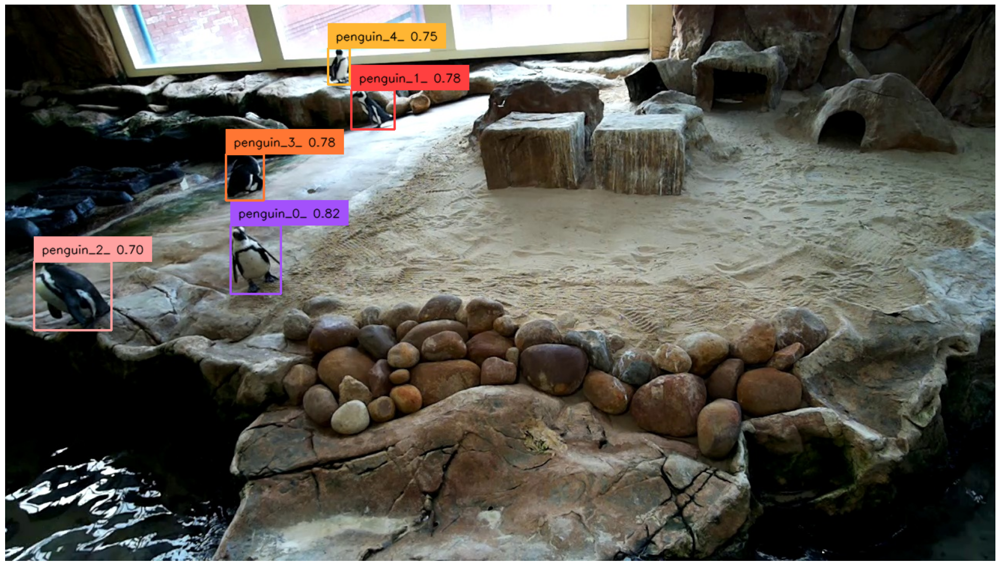

In [ ]:
# display the image with the bounding boxes
display_bbox(frame_id, entry)

In [ ]:
display_bbox_specific_penguin(frame_id, entry, 7
                              )

In [ ]:
# obtain metrics
total_visible_penguins = 10             #input value
total_correct_id_penguins_found = 9             #input value
total_misidentified_penguins = 2     #input value

input_accuracy(frame_id, total_visible_penguins, total_correct_id_penguins_found, total_misidentified_penguins, accuracy_metrics)

In [ ]:
# Convert dictionary items to a list and get the last 3 items
last_three_items = list(accuracy_metrics.items())[-3:]

# Print the last 3 entries
for key, value in last_three_items:
    print(f"{key}: {value}")

frame_PenguinPi1_video_2024-03-02_07-25.mp4_2.jpg: {'TP': 9, 'FP': 2, 'TN': 0, 'FN': 0}
frame_PenguinPi1_video_2024-03-02_07-25.mp4_4.jpg: {'TP': 7, 'FP': 4, 'TN': 0, 'FN': 3}
frame_PenguinPi1_video_2024-03-02_07-25.mp4_3.jpg: {'TP': 9, 'FP': 2, 'TN': 0, 'FN': 1}


##### remove bbox #####

In [ ]:
# remove bbox that don't want repeat for all extra bounding boxes
penguin_number = 8
remove_bbox(penguin_number, entry)

##### add bounding box #####

In [ ]:
# repeat the following two for each bbox to add

In [ ]:
show_img_find_coords(frame_id, entry)

In [ ]:
# input is x_left, x_right, y_top, y_bottom
bbox_new = bbox_location_norm(0,76,274,326)
# 500,547,149,196
#496,547,171,226
#0,68,292,369
#0,76,274,326
#27,134,327,429

In [ ]:
add_entry(bbox_new, entry)

##### show output and save locally in variables #####

/content/GroundingDINO/groundingdino/util/inference.py:124: SupervisionWarnings:

BoxAnnotator is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead



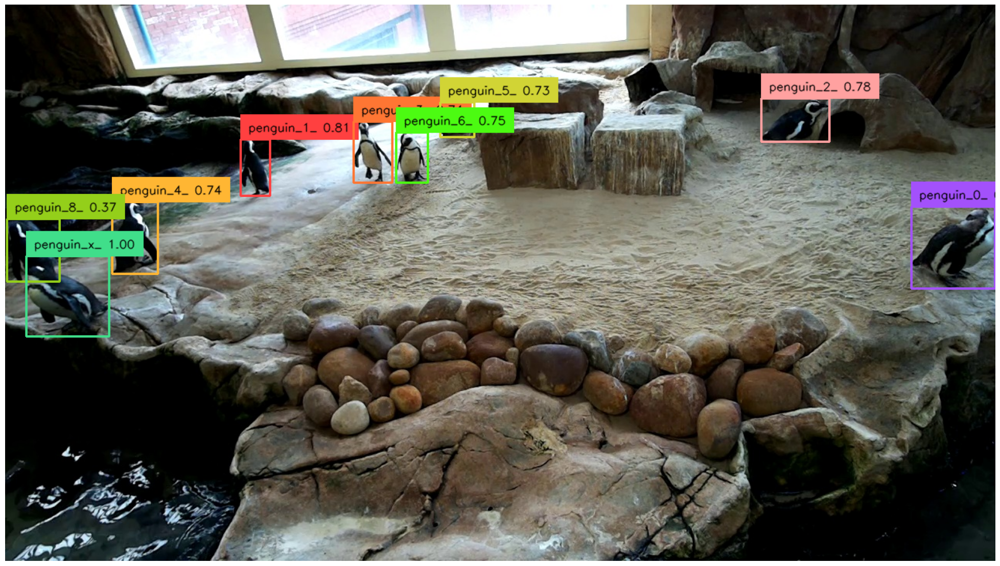

In [ ]:
# disply the output
display_bbox(frame_id, entry)

In [ ]:
# adjust bounding box phrases to include an ennumated value
new_phrases = enumarate_phrases(entry['phrases'])
entry['phrases'] = new_phrases
# save it to the series to be saved in the json file
series.at[frame_id] = entry

In [ ]:
counter += 1

In [ ]:
# save your series and the prediction metrics at the end of an annotation session

##### save output #####

In [ ]:
folder_path = '/content/drive/MyDrive/Colab Notebooks'

# get current date time
now = datetime.now()
# Convert to a string
datetime_string = now.strftime("%Y-%m-%d_%H:%M:%S")

In [ ]:
# save the annotations to a file ()
file_path = os.path.join(folder_path, f'train_annotations_{datetime_string}.json')
series.to_json(file_path)

# save evaluation metrics to file
file_path = os.path.join(folder_path, f'train_groundingdino_eval_{datetime_string}.json')
pd.Series(accuracy_metrics).to_json(file_path)

# save the counter position
file_path = os.path.join(folder_path, f'train_counter_{datetime_string}.txt')
with open(file_path, 'w') as file:
    # Write the contents of the variable to the file
    file.write(str(counter))

### Calculating Performance ###

#### counting the tp, fp, tn, fn ####

In [ ]:
# working with the drive
from google.colab import drive

In [ ]:
# mount drive
drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
import pandas as pd
import json

In [ ]:
# function to load a .json file to a series
def load_json_to_series(json_file_path):
    # Load the JSON file into a pandas Series
    series = pd.read_json(json_file_path, typ='series')
    return series

In [ ]:
# loading the evalutation metrics
last_save_metric = 'train_groundingdino_eval_2024-03-27_06:31:21.json'
test_json_path_metric = f'/content/drive/MyDrive/Colab Notebooks/{last_save_metric}'
accuracy_metrics0 = load_json_to_series(test_json_path_metric)

last_save_metric = 'val_groundingdino_eval_2024-03-26_12:51:24.json'
test_json_path_metric = f'/content/drive/MyDrive/Colab Notebooks/{last_save_metric}'
accuracy_metrics1 = load_json_to_series(test_json_path_metric)

last_save_metric = 'test_groundingdino_eval_2024-03-26_10:19:27.json'
test_json_path_metric = f'/content/drive/MyDrive/Colab Notebooks/{last_save_metric}'
accuracy_metrics2 = load_json_to_series(test_json_path_metric)

In [ ]:
final_accuracy_metrics = pd.concat([accuracy_metrics0, accuracy_metrics1, accuracy_metrics2])

In [ ]:
len(final_accuracy_metrics)

200

In [ ]:
# Initialize counters
total_TP = total_FP = total_TN = total_FN = 0

# Iterate through the Series to sum the values
for metrics in final_accuracy_metrics:
    total_TP += metrics['TP']
    total_FP += metrics['FP']
    total_TN += metrics['TN']
    total_FN += metrics['FN']

print(f"Total TP: {total_TP}")
print(f"Total FP: {total_FP}")
print(f"Total TN: {total_TN}")
print(f"Total FN: {total_FN}")

Total TP: 1470
Total FP: 289
Total TN: 0
Total FN: 105


### Visualising the output ###

In [ ]:
import supervision as sv

ModuleNotFoundError: No module named 'supervision'

In [ ]:
def display_bbox(frame_name, test_annotations):

  image_source, image = load_image(f"/content/drive/MyDrive/Colab Notebooks/test_frames/{frame_name}")

  bboxes = torch.tensor(test_annotations[frame_name]['bboxes'])
  logits = torch.tensor(test_annotations[frame_name]['logits'])

  annotated_frame = annotate(image_source=image_source, boxes=bboxes, logits=logits, phrases=test_annotations[frame_name]['phrases'])

  %matplotlib inline
  sv.plot_image(annotated_frame, (16, 16))

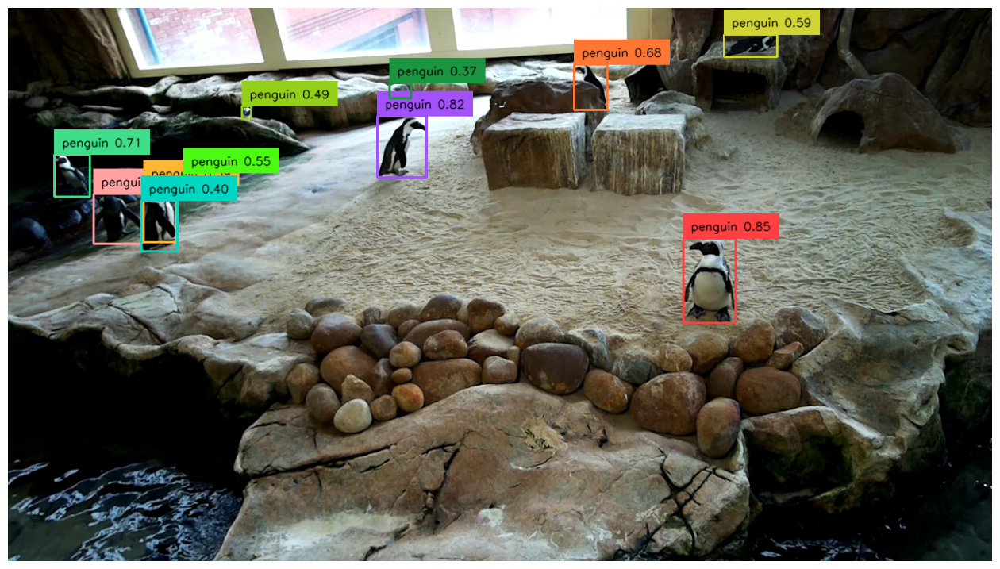

In [ ]:
display_bbox('frame_PenguinPi1_video_2024-03-03_09-22.mp4_17.jpg', test_annotations)

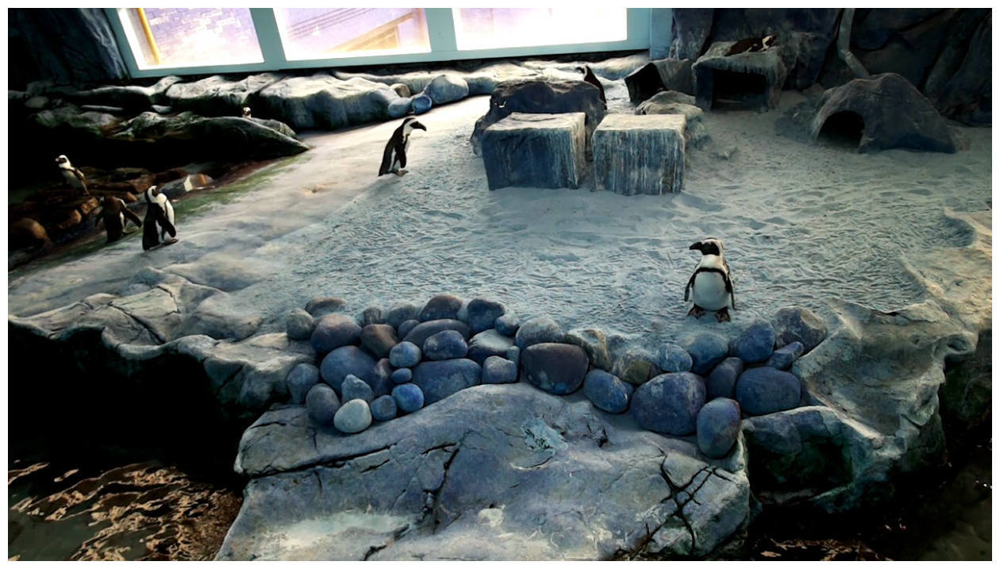

In [ ]:
image_source, image = load_image(f"/content/drive/MyDrive/Colab Notebooks/test_frames/frame_PenguinPi1_video_2024-03-03_09-22.mp4_17.jpg")
sv.plot_image(image_source, (16, 16))

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:962: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:460: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:90: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


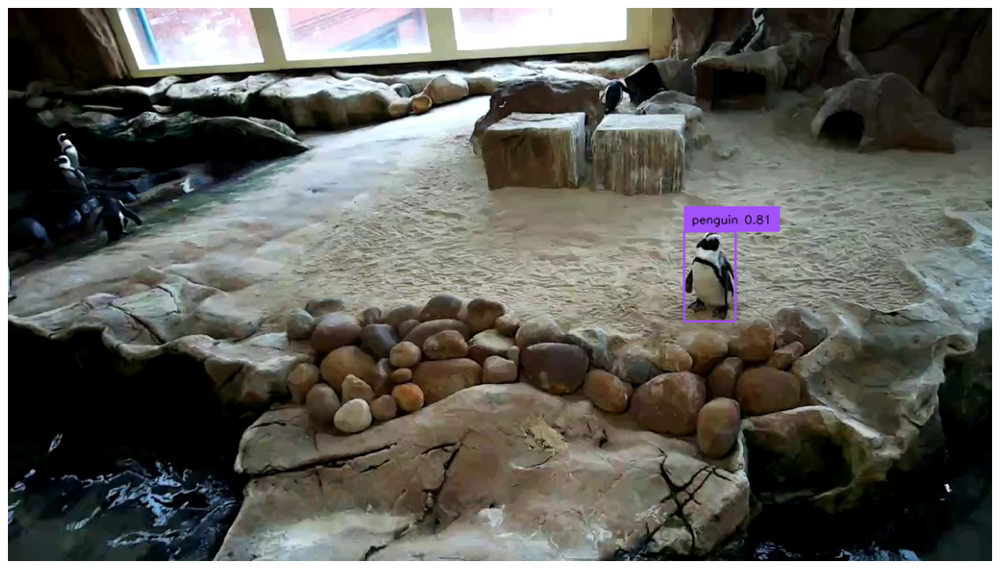

In [ ]:

IMAGE_NAME = "frame_PenguinPi1_video_2024-03-03_09-22.mp4_0.jpg" #/content/test_frames/frame_PenguinPi1_video_2024-03-03_09-22.mp4_0.jpg
IMAGE_PATH = os.path.join(HOME, "test_frames", IMAGE_NAME)

TEXT_PROMPT = "penguin"
BOX_TRESHOLD = 0.78
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

In [ ]:
import torch

# Creating the tensor
boxes2 = torch.tensor([[0.1, 1.0, 0.1, 0.1524],
                       [0.6077, 0.4328, 0.0732, 0.1521]])

print(boxes2)


tensor([[0.1000, 1.0000, 0.1000, 0.1524],
        [0.6077, 0.4328, 0.0732, 0.1521]])


In [ ]:
#bb = (origin in top corner) (distance from x origin to the centre point of the box, distance from y origin to centre of box, x distance - width - in terms of percentage of entire image, y distance - height - in terms of percentage of entire image)

In [ ]:
image.type()

'torch.FloatTensor'

In [ ]:
print(image.size())

torch.Size([3, 750, 1333])


In [ ]:
image_source.shape

(720, 1280, 3)

In [ ]:
print(len(image_source[0]))

1280


In [ ]:
print(len(image_source))

720


In [ ]:
print(logits)

tensor([0.7908, 0.7831])


In [ ]:
print(phrases)

['penguin', 'penguin']


In [ ]:
print(boxes)

tensor([[0.5110, 0.4089, 0.0426, 0.1524],
        [0.6077, 0.4328, 0.0732, 0.1521]])


In [ ]:
print(annotated_frame.shape)

(720, 1280, 3)


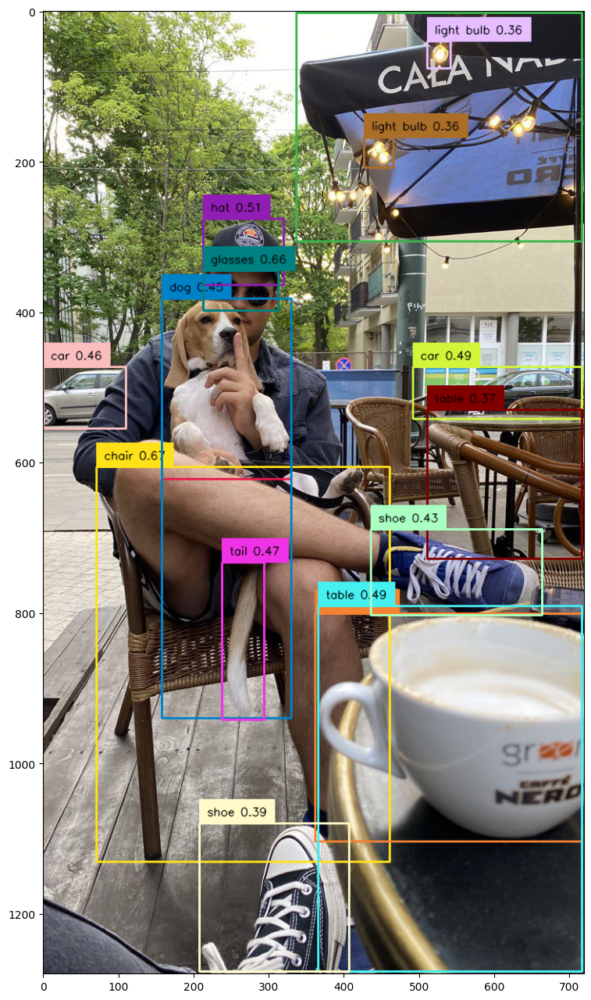

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "dog-3.jpeg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

TEXT_PROMPT = "chair, dog, table, shoe, light bulb, coffee, hat, glasses, car, tail, umbrella"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

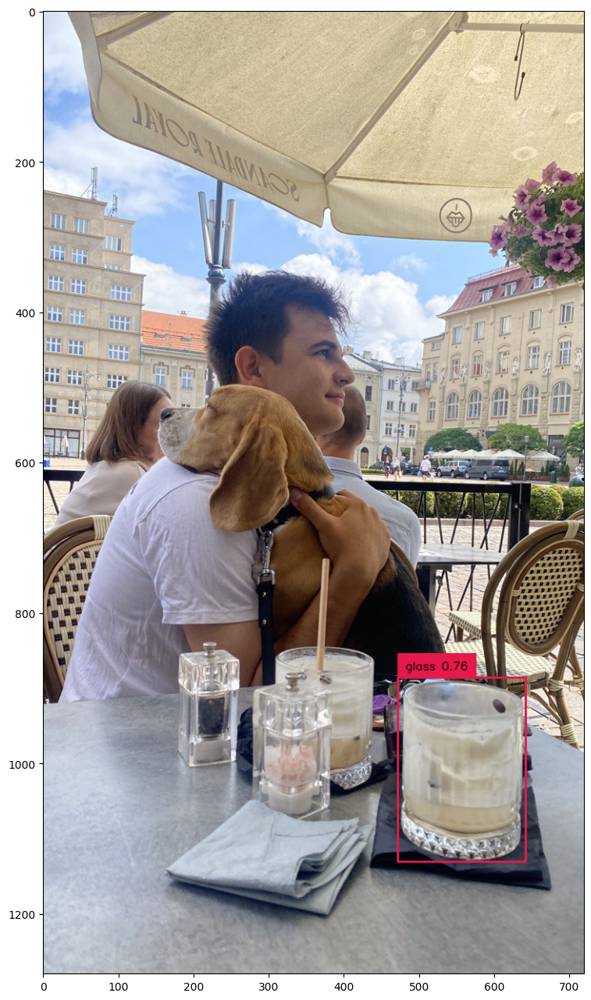

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "dog-2.jpeg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

TEXT_PROMPT = "glass most to the right"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

## Grounding DINO with Roboflow Dataset

In [ ]:
%cd {HOME}

/content


In [ ]:
import roboflow

roboflow.login()

You are already logged into Roboflow. To make a different login, run roboflow.login(force=True).


In [ ]:
from random import randrange
from roboflow.core.dataset import Dataset


def pick_random_image(dataset: Dataset, subdirrectory: str = "valid") -> str:
    image_directory_path = f"{dataset.location}/{subdirrectory}"
    image_names = os.listdir(image_directory_path)
    image_index = randrange(len(image_names))
    image_name = image_names[image_index]
    image_path = os.path.join(image_directory_path, image_name)
    return image_path

In [ ]:
from roboflow import Roboflow
rf = Roboflow()
project = rf.workspace("work-safe-project").project("safety-vest---v4")
dataset = project.version(3).download("coco")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Safety-vest---v4-3 in coco:: 100%|██████████| 438/438 [00:00<00:00, 836.65it/s]


In [ ]:
TEXT_PROMPT = ", ".join(project.classes.keys())
TEXT_PROMPT

'reflective, not_helmet, helmet, not_reflective'

In [ ]:
image_path = pick_random_image(dataset=dataset)

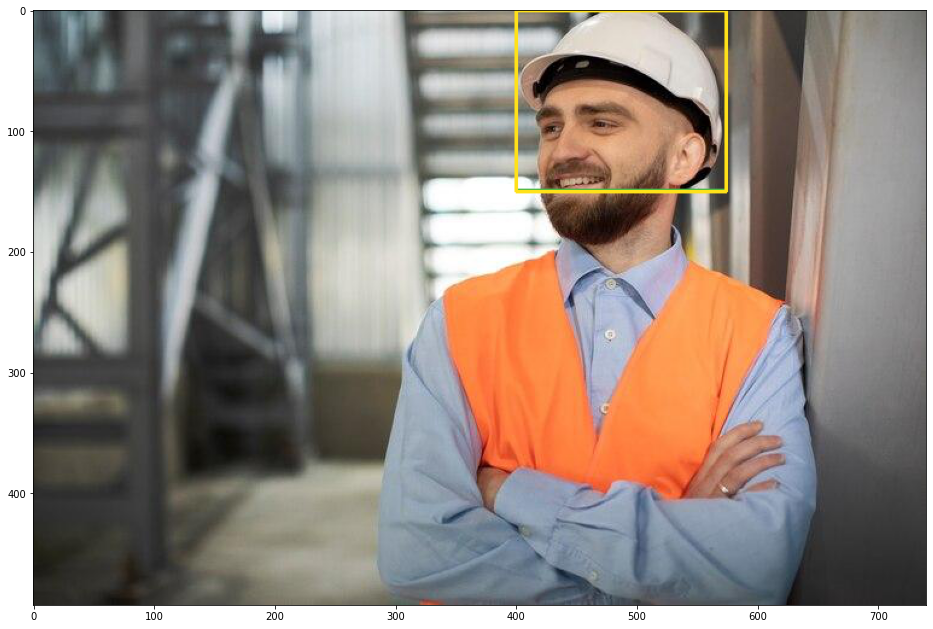

In [ ]:
import os
import supervision as sv

BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(image_path)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

**NOTE:** The design of the prompt is very important. Try to be as accurate as possible. Avoid abbreviations.

In [ ]:
TEXT_PROMPT = "reflective safety vest, helmet, head, nonreflective safety vest"

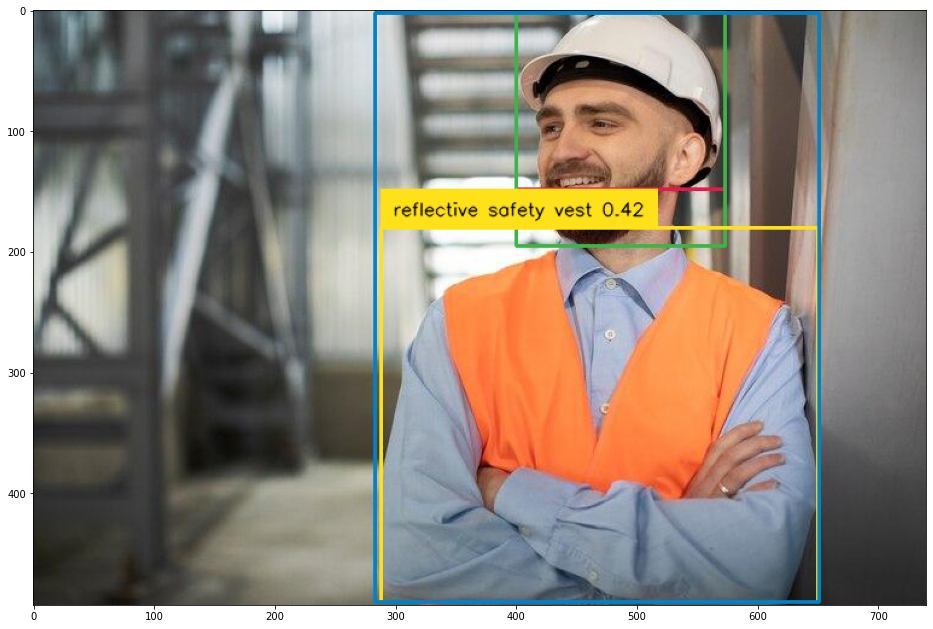

In [ ]:
import os
import supervision as sv

BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(image_path)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.